# Рынок заведений общественного питания Москвы

Цель:
подготовить исследование рынка Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места.

**Ход исследования:**

- загружу и проанализирую исходные данные
- проведу предобработку данных (проверю на явные и неявные дубликаты, пропуски, изучу наличие аномалий и выбросов, создам новые столбцы для дальнейшей работы)
- проведу анализ данных 
    - изучу данные и найду особенности и зависимости путем визуализации на графиках
    - изучу распределение характеристик заведений на карте по районам и по улицам
- сделаю общий вывод и дам рекокмендации
- проведу отдельный детальный анализ для открытия кофейни
    - изучу их особенности и распределение характеристик на карте по районам
- сделаю выводы и дам рекомендации 

## Загрузка данных

In [1]:
import pandas as pd
from matplotlib import pyplot as plt
import seaborn as sns
import plotly.express as px
plt.style.use('fast')

In [2]:
!pip install folium
import json
import folium
from folium.features import CustomIcon
from folium import Map, Marker
from folium.plugins import MarkerCluster

In [3]:
#загрузка данных

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8401,Суши Мания,кафе,"Москва, Профсоюзная улица, 56",Юго-Западный административный округ,"ежедневно, 09:00–02:00",55.670021,37.552480,4.4,NaN,NaN,NaN,NaN,0,86.0
8402,Миславнес,кафе,"Москва, Пролетарский проспект, 19, корп. 1",Южный административный округ,"ежедневно, 08:00–22:00",55.640875,37.656553,4.8,NaN,NaN,NaN,NaN,0,150.0
8403,Самовар,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648859,37.743219,3.9,NaN,Средний счёт:от 150 ₽,150.0,NaN,0,150.0
8404,Чайхана Sabr,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648849,37.743222,4.2,NaN,NaN,NaN,NaN,1,150.0


In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


В данных представлено 8406 заведений. Названия столбцов и типы данных их содержимого соответствуют правильным, поэтому менять ничего не буду. Также можно отметить, что в данных наблюдаются пропуски, на следующем шаге изучу их более подробно.

In [5]:
def first_look(df):
    """ Функция получения первичной информации о датафрейме """ 


    print('------------- Первые 5 строк ------------')
    display(df.head())
    
    print ('\n\n------------- Типы данных ------------')
    print (df.info())
    print ('\n\n------------- Пропуски ------------')
    count = 0
    for element in df.columns:
        if df[element].isna().sum() > 0: 
            print(element, ' - ', df[element].isna().sum(), 'пропусков')
            count = +1
            
    if count == 0:
        print('Пропусков НЕТ')

    print ('\n\n------------- Дубликаты ------------')
    if df.duplicated().sum() > 0:
        print('Дубликатов: ', df.duplicated().sum())
    else:
        print('Дубликатов НЕТ')

In [6]:
first_look(data)

------------- Первые 5 строк ------------


,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0




------------- Типы данных ------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB
None


-------------

## Предобработка данных

### Поиск дубликатов

In [9]:
print('Количество дубликатов:', data.duplicated().sum())

Количество дубликатов: 0


Явных дубликатов в данных не обнаружено. Посмотрю дубликаты по названию и адресу.

In [10]:
print('Количество дубликатов по названию и адресу:', data.duplicated(['name', 'address']).sum())

Количество дубликатов по названию и адресу: 0



    
Для поиска неявных дубликатов приведу столбцы к нижнему регистру.


In [11]:
data['name'] = data['name'].str.lower()
data['address'] = data['address'].str.lower()
print('Количество дубликатов по названию и адресу:', data.duplicated(['name', 'address']).sum())

Количество дубликатов по названию и адресу: 4



    
Также можно предположить, что разные виды заведений могут встречаться по одному адресу, поэтому в проверку дубликатов внесу еше категорию.


In [12]:
print('Количество дубликатов по названию и адресу:', data.duplicated(['name', 'address', 'category']).sum())

Количество дубликатов по названию и адресу: 2


In [13]:
data[data.duplicated(['name', 'address', 'category'])]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
215,кафе,кафе,"москва, парк ангарские пруды",Северный административный округ,"ежедневно, 10:00–22:00",55.881438,37.531848,3.2,NaN,NaN,NaN,NaN,0,NaN
1511,more poke,ресторан,"москва, волоколамское шоссе, 11, стр. 2",Северный административный округ,"пн-чт 09:00–18:00; пт,сб 09:00–21:00; вс 09:00...",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,1,188.0


   
Было найдено 2 неявных дубликата. Далее удалю их из датафрейма.


In [14]:
data = data.drop_duplicates(['name', 'address', 'category'])
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8404 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8404 non-null   object 
 1   category           8404 non-null   object 
 2   address            8404 non-null   object 
 3   district           8404 non-null   object 
 4   hours              7868 non-null   object 
 5   lat                8404 non-null   float64
 6   lng                8404 non-null   float64
 7   rating             8404 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8404 non-null   int64  
 13  seats              4794 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 984.8+ KB


### Работа с пропусками

In [15]:
print(data.isna().sum())

name                    0
category                0
address                 0
district                0
hours                 536
lat                     0
lng                     0
rating                  0
price                5089
avg_bill             4588
middle_avg_bill      5255
middle_coffee_cup    7869
chain                   0
seats                3610
dtype: int64


In [16]:
pd.DataFrame(round(data.isna().mean().sort_values(ascending=False)*100,1)).style.background_gradient('coolwarm')

,0
middle_coffee_cup,93.600000
middle_avg_bill,62.500000
price,60.600000
avg_bill,54.600000
seats,43.000000
hours,6.400000
name,0.000000
category,0.000000
address,0.000000
district,0.000000


Возможные причины пропусков:
- hours, price, avg_bill - не было данных о режиме работе в картах / не все заведения указывают эти данные 
- middle_avg_bill, middle_coffee_cup - в этих столбцах накладываются пропуски из столбца avg_bill. Столбец middle_coffee_cup содержит больше проусков, потому что заполняются данные только о кофейнях, а в столбце middle_avg_bill - для остальных категорий.

Пропуски оставлю как есть, потому что ничем логичным их заполнить не получится.

### Поиск аномалий и выбросов

In [17]:
data.describe()

,lat,lng,rating,middle_avg_bill,middle_coffee_cup,chain,seats
count,8404.000000,8404.000000,8404.000000,3149.000000,535.000000,8404.000000,4794.000000
mean,55.750086,37.608593,4.230021,958.053668,174.721495,0.381247,108.405090
std,0.069649,0.098598,0.470270,1009.732845,88.951103,0.485722,122.840831
min,55.573942,37.355651,1.000000,0.000000,60.000000,0.000000,0.000000
25%,55.705087,37.538643,4.100000,375.000000,124.500000,0.000000,40.000000
50%,55.753401,37.605263,4.300000,750.000000,169.000000,0.000000,75.000000
75%,55.795025,37.664802,4.400000,1250.000000,225.000000,1.000000,140.000000
max,55.928943,37.874466,5.000000,35000.000000,1568.000000,1.000000,1288.000000


Text(0.5, 1.0, 'Средний цена кофе')

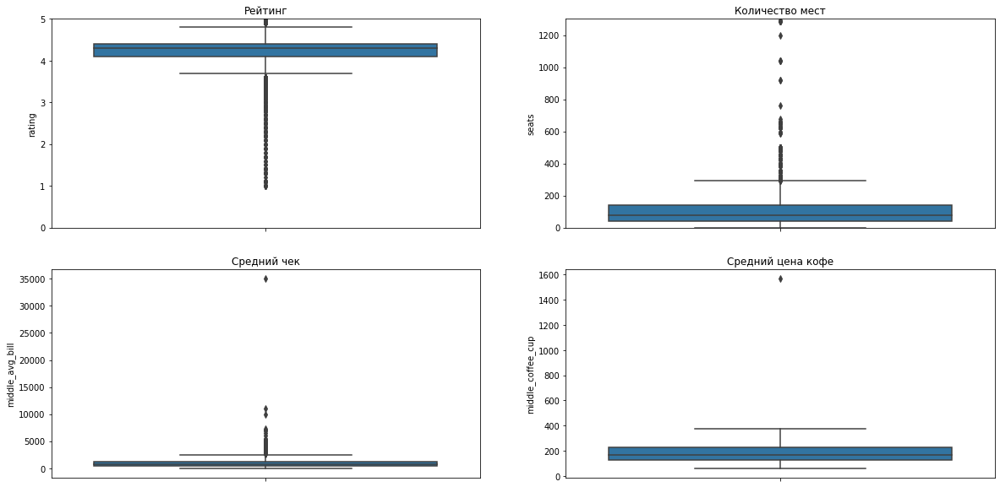

In [18]:
plt.figure(figsize=(20, 10))
    
ax1 = plt.subplot(2, 2, 1)
sns.boxplot(y=data['rating'])
plt.ylim(0, 5)
plt.title('Рейтинг')

# второй график
ax2 = plt.subplot(2, 2, 2)
sns.boxplot(y=data['seats'])
plt.ylim(0, 1300)
plt.title('Количество мест')
    
# третий график
ax3 = plt.subplot(2, 2, 3)
sns.boxplot(y=data['middle_avg_bill'])
plt.title('Средний чек')

    
# четвёртый график
ax4 = plt.subplot(2, 2, 4)
sns.boxplot(y=data['middle_coffee_cup'])
plt.title('Средний цена кофе')

По графикам видно, что присутствуют единичные сильные выбросы в столбце middle_coffee_cup = 1568 и middle_avg_bill = 35000. Удалю их, чтобы они не искажали данные.

In [19]:
data = data.query('middle_coffee_cup != 1568 and middle_avg_bill != 35000')

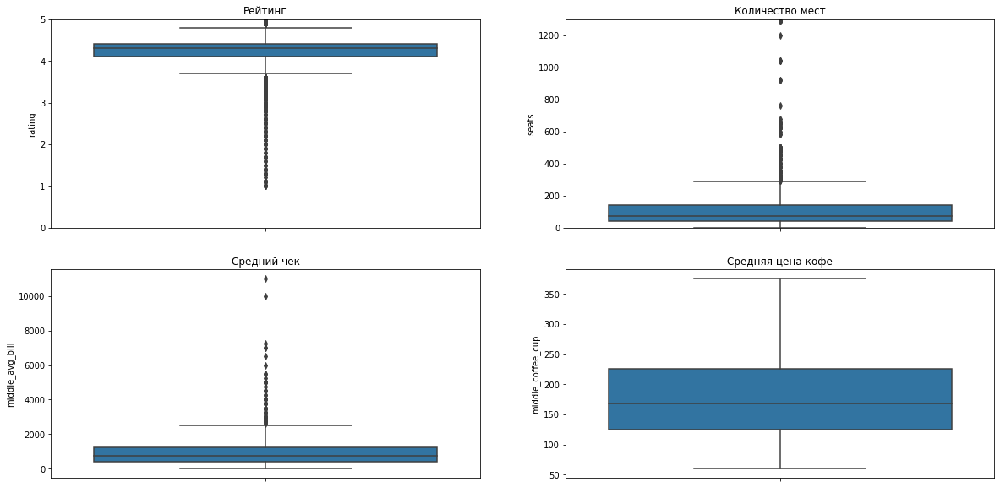

In [20]:
plt.figure(figsize=(20, 10))
    
ax1 = plt.subplot(2, 2, 1)
sns.boxplot(y=data['rating'])
plt.ylim(0, 5)
plt.title('Рейтинг')

 # второй график
ax2 = plt.subplot(2, 2, 2)
sns.boxplot(y=data['seats'])
plt.ylim(0, 1300)
plt.title('Количество мест')
    
# третий график
ax3 = plt.subplot(2, 2, 3)
sns.boxplot(y=data['middle_avg_bill'])
plt.title('Средний чек')

    
# четвёртый график
ax4 = plt.subplot(2, 2, 4)
sns.boxplot(y=data['middle_coffee_cup'])
plt.title('Средняя цена кофе')
plt.show()

Теперь данные распределены более равномерно.

### Создание новых столбцов

In [21]:
#создаю столбец с улицей из столбца с адресом
import warnings
warnings.filterwarnings('ignore')
data['street'] = data['address'].str.split(", ", expand=True)[1]
data['street'].head(20)

0               улица дыбенко
1               улица дыбенко
2          клязьминская улица
3     улица маршала федоренко
4         правобережная улица
5              ижорская улица
6          клязьминская улица
7          клязьминская улица
8           дмитровское шоссе
9             ангарская улица
10         левобережная улица
11    улица маршала федоренко
12                       мкад
13            базовская улица
14            ангарская улица
15    улица бусиновская горка
16            базовская улица
17        ленинградское шоссе
18          коровинское шоссе
19            ижорский проезд
Name: street, dtype: object

In [23]:
#создание столбца с булевым значением (круглосуточное заведение или нет)
data['is_24/7'] = ''
data['is_24/7'] = data['hours'].apply(lambda x: True if x == 'ежедневно, круглосуточно' else False)
data.head(5)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
0,wowфли,кафе,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица дыбенко,False
1,четыре комнаты,ресторан,"москва, улица дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица дыбенко,False
2,хазри,кафе,"москва, клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,клязьминская улица,False
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица маршала федоренко,False
4,иль марко,пиццерия,"москва, правобережная улица, 1б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,правобережная улица,False


На этапе предобработки данных:
- не было обнаружено дубликатов
- пропуски в столбцах оставила как есть
- удалила едичные сильные выбросы в столбцах middle_avg_bill и middle_coffee_cup
- добавила 2 новых столбца с названием улиц и режимом работы заведения (круглосуточное или нет)

## Анализ данных

### Распределение категорий всех заведений и их количество

In [24]:
#изучу какие категории представлены в данных и их количество
data_cat = data.groupby('category').agg({'name':'count'}).reset_index()
data_cat['perc'] = round(data_cat['name']/ data_cat['name'].sum() *100) 
data_cat = data_cat.sort_values(by='perc',ascending=False)
data_cat

,category,name,perc
3,кафе,2377,28.0
6,ресторан,2041,24.0
4,кофейня,1412,17.0
0,"бар,паб",765,9.0
5,пиццерия,633,8.0
2,быстрое питание,603,7.0
7,столовая,315,4.0
1,булочная,256,3.0


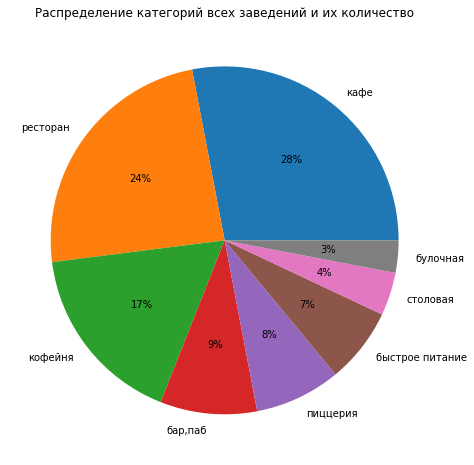

In [25]:
plt.figure(figsize=(8,8))
plt.pie(data_cat['perc'], labels = data_cat['category'], autopct = '%.0f%%')
plt.title('Распределение категорий всех заведений и их количество')
plt.show()

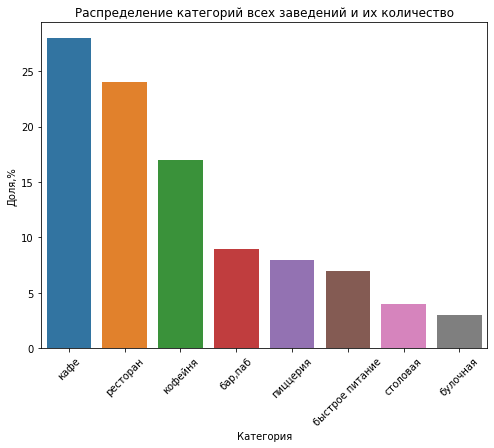

In [26]:
plt.figure(figsize=(8,6))
sns.barplot(x='category', y = 'perc', data = data_cat)
plt.xticks(rotation=45)
plt.title('Распределение категорий всех заведений и их количество')
plt.xlabel('Категория')
plt.ylabel('Доля,%')
plt.show()

Среди всех категорий заведений можно выделить 3 лидера: кафе, ресторан, кофейня. Наименьшее количество заведений приходится на категории столовая и булочная.

### Распределение количества посадочных мест по категориям заведений

In [27]:
#Изучу количество посадочных мест в заведениях по категориям
data_seats = data.groupby('category').agg({'seats':'median'}).reset_index().sort_values(by='seats', ascending=False)
data_seats

,category,seats
6,ресторан,86.0
0,"бар,паб",82.5
4,кофейня,80.0
7,столовая,75.5
2,быстрое питание,65.0
3,кафе,60.0
5,пиццерия,55.0
1,булочная,50.0


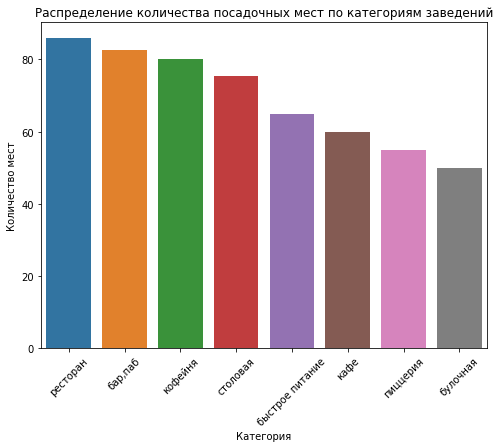

In [28]:
plt.figure(figsize=(8,6))
sns.barplot(x='category', y = 'seats', data = data_seats)
plt.xticks(rotation=45)
plt.title('Распределение количества посадочных мест по категориям заведений')
plt.xlabel('Категория')
plt.ylabel('Количество мест')
plt.show()

Можно отметить 4 категории заведений, где наибольшее количество посадочных мест: ресторан, бар/паб, кофейня, столовая. Наименьшее количество в пиццериях и булочных.

### Соотношение сетевых/несетевых заведений по Москве

In [29]:
#рассмотрю соотношение сетевых/несетвых заведений
data_seats = data.groupby('chain').agg({'name':'count'}).reset_index().sort_values(by='name', ascending=False)
data_seats.loc[[0], 'chain'] = 'несетевой'
data_seats.loc[[1], 'chain'] = 'сетевой'
data_seats['perc'] = round(data_seats['name']/ data_seats['name'].sum() *100) 
data_seats

,chain,name,perc
0,несетевой,5199,62.0
1,сетевой,3203,38.0


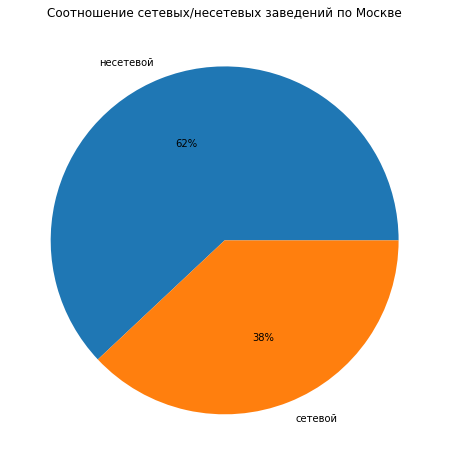

In [30]:
plt.figure(figsize=(8,8))
plt.pie(data_seats['perc'], labels = data_seats['chain'], autopct = '%.0f%%')
plt.title('Соотношение сетевых/несетевых заведений по Москве')
plt.show()

По диаграмме видно, что большая часть заведений относится к несетевым (62%).

### Распределение сетевых заведений по категориям

In [35]:

df_chain_share = data.pivot_table(index='category', columns='chain', values='name', aggfunc='count')
df_chain_share.columns = ['not_chain', 'chain']
df_chain_share['total'] = df_chain_share['not_chain'] + df_chain_share['chain']
df_chain_share['share'] = (df_chain_share['chain']/df_chain_share['total']*100).round().astype('int')
df_chain_share = df_chain_share.sort_values(by='share', ascending=False)
df_chain_share

,not_chain,chain,total,share
category,,,,
булочная,99,157,256,61
пиццерия,303,330,633,52
кофейня,693,719,1412,51
быстрое питание,371,232,603,38
ресторан,1312,729,2041,36
кафе,1598,779,2377,33
столовая,227,88,315,28
"бар,паб",596,169,765,22


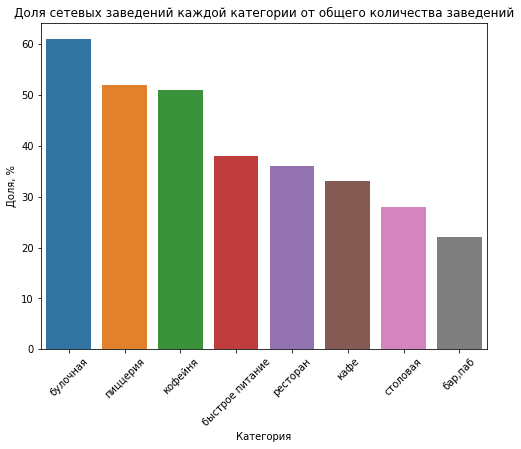

In [36]:
plt.figure(figsize=(8,6))
sns.barplot(x= df_chain_share.index, y = 'share', data = df_chain_share)
plt.xticks(rotation=45)
plt.title('Доля сетевых заведений каждой категории от общего количества заведений')
plt.xlabel('Категория')
plt.ylabel('Доля, %')
plt.show()

    
Чаще всего из всех категорий заведений сетевыми являются булочная, пиццерия и кофейня, по соотношению с общим количеством заведений данной категории.


### Топ-15 популярных сетей в Москве

In [37]:
#найду топ-15 популярных сетей в Москве. И добавлю столбцы - категория, рейтинг, средний чек и средняя цена чашки кофе
top_15 = data.query('chain==1').groupby('name').agg({'lat': 'count', 'category': 'first', 'rating': 'mean',\
                                                     'middle_avg_bill':'median', 'middle_coffee_cup': 'mean'})\
    .sort_values(by = 'lat', ascending=False).reset_index()
top_15 = top_15.rename(columns = {'lat': 'count'}) 
top_15['rating'] = round(top_15['rating'], 2)
top_15['middle_coffee_cup'] = round(top_15['middle_coffee_cup'])
top_15 = top_15.loc[:14]
top_15

,name,count,category,rating,middle_avg_bill,middle_coffee_cup
0,шоколадница,119,кофейня,4.18,650.0,256.0
1,домино'с пицца,76,пиццерия,4.17,500.0,NaN
2,додо пицца,74,пиццерия,4.29,391.5,NaN
3,one price coffee,71,кофейня,4.06,NaN,95.0
4,яндекс лавка,69,ресторан,3.87,NaN,NaN
5,cofix,65,кофейня,4.08,NaN,69.0
6,prime,50,ресторан,4.12,300.0,NaN
7,хинкальная,44,быстрое питание,4.32,1000.0,NaN
8,кофепорт,42,кофейня,4.15,NaN,96.0
9,кулинарная лавка братьев караваевых,39,кафе,4.39,450.0,NaN


In [38]:
fig = px.bar(top_15.sort_values(by='count', ascending=True), x= 'count', y='name', text= 'count')
fig.update_layout(title="Топ-15 популярных сетей в Москве",
                  xaxis_title="Количество",
                  yaxis_title="Название")

Лидер с большим отрывом по количеству заведений - Шоколадница. Далее идут - Домино'с Пицца, Додо пицца, One Price Coffee, Яндекс Лавка и Cofix. Далее посмотрю на графиках категорию, рейтинг и средние чеки по топ-15 заведениям, чтобы найти зависимости.

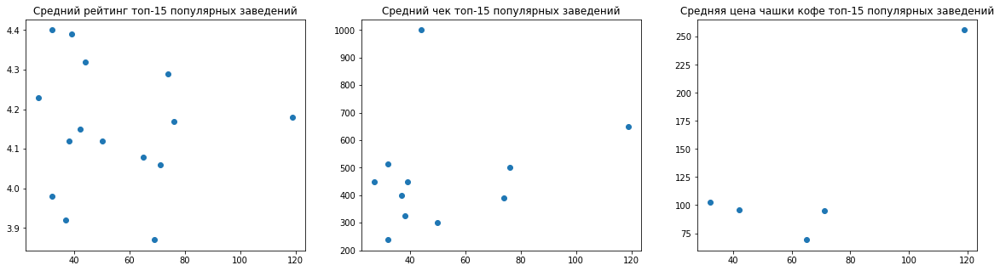

In [39]:
plt.figure(figsize=(20, 5))
    
ax1 = plt.subplot(1, 3, 1)
plt.scatter(top_15['count'], top_15['rating'])
plt.title('Средний рейтинг топ-15 популярных заведений')

 # второй график
ax2 = plt.subplot(1, 3, 2)
plt.scatter(top_15['count'], top_15['middle_avg_bill'])
plt.title('Средний чек топ-15 популярных заведений')

    
# третий график 
ax3 = plt.subplot(1, 3, 3)
plt.scatter(top_15['count'], top_15['middle_coffee_cup'])
plt.title('Средняя цена чашки кофе топ-15 популярных заведений')
plt.show()

По графикам видно, что рейтинг варьируется от 3.9 до 4.4, то есть никакой зависимости нет. Средняя цена чека у большинства заведений до 700руб, а средняя цена чашки кофе - около 100руб, кроме Шоколадницы - 256руб. Посмотрю на категори топ-15 популярных заведений.

In [40]:
a = top_15.groupby('category').agg({'name':'count'}).reset_index().sort_values(by='name', ascending=False)
a['perc'] = round(a['name']/ a['name'].sum() *100) 
a

,category,name,perc
3,кофейня,5,33.0
2,кафе,3,20.0
5,ресторан,3,20.0
4,пиццерия,2,13.0
0,булочная,1,7.0
1,быстрое питание,1,7.0


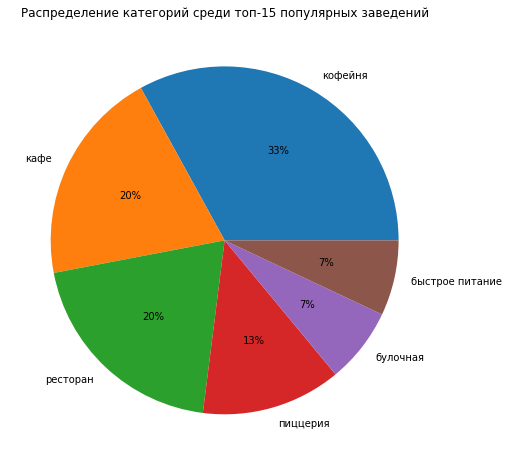

In [41]:
plt.figure(figsize=(8,8))
plt.pie(a['perc'], labels = a['category'], autopct = '%.0f%%')
plt.title('Распределение категорий среди топ-15 популярных заведений')
plt.show()

Более 70% популярных заведений Москвы занимают кофейни (33%), кафе и рестораны (по 20%).

### Распределение общего количества заведений и количество заведений по категориям в административных районах Москвы

In [42]:
#посмотрю распределение общего количества заведений и количество заведений по категориям в административных районах Москвы
data_district = data.pivot_table(index=['district','category'], values = 'name', aggfunc = 'count').sort_values(by='name', ascending=False).reset_index()
data_district.rename(columns={'name': 'count'}, inplace=True)
data_district

,district,category,count
0,Центральный административный округ,ресторан,670
1,Центральный административный округ,кафе,464
2,Центральный административный округ,кофейня,428
3,Центральный административный округ,"бар,паб",364
4,Юго-Восточный административный округ,кафе,282
...,...,...,...
67,Северо-Западный административный округ,"бар,паб",23
68,Северо-Западный административный округ,столовая,18
69,Юго-Западный административный округ,столовая,17
70,Юго-Восточный административный округ,булочная,13


In [43]:
fig2 = px.bar(data_district, x='district', y='count', color = 'category', text = 'count')

fig2.update_layout(title='Общее количество заведений и количество заведений каждой категории по районам',
                 width = 1000,
                 height = 900,
                 xaxis_title="Административный район",
                yaxis_title="Количество заведений"
                )

В Центральном районе сосредоточена наибольшая часть заведений (в среднем в 3 раза больше, чем в остальных районах). 
Распределение категорий заведений отличается в центральном округе от остальных:
- в центральном - рестораны лидируют, далее значительно выделяются кафе, кофейня, бар/паб;
- в остальных округах на первом месте по количеству заведений - кафе, затем - рестораны и кофейни.

### Распределение среднего рейтинга по категориям заведений

In [44]:
#посмотрю на распределение среднего рейтинга по категориям заведений
data_rating = data.groupby('category').agg({'rating': 'mean'}).reset_index().sort_values(by='rating', ascending=False)
data_rating

,category,rating
0,"бар,паб",4.387712
5,пиццерия,4.301264
6,ресторан,4.290495
4,кофейня,4.277337
1,булочная,4.268359
7,столовая,4.211429
3,кафе,4.124274
2,быстрое питание,4.050249


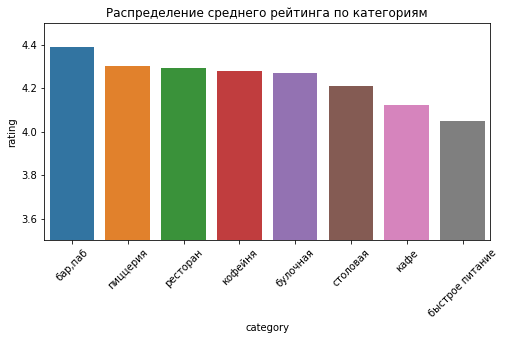

In [45]:
plt.figure(figsize=(8,4))
sns.barplot(data=data_rating, x='category', y='rating')
plt.xticks(rotation=45)
plt.title('Распределение среднего рейтинга по категориям')
plt.ylim(3.5, 4.5)
plt.show()


Рейтинг всех заведений варьируется от 4 до 4.4. Наилучший рейтинг наблюдается у баров/пабов, наименьший - у ресторанов быстрого питания. Далее посмотрю распределение среднего рейтинга на хороплете.

### Распределение среднего рейтинга по регионам на карте

In [46]:
#импортирую карту и хороплет
from folium import Map, Choropleth
with open('/datasets/admin_level_geomap.geojson', 'r') as f:
    geo_json = json.load(f)

# загружаю JSON-файл с границами округов Москвы
try:
    state_geo = '/datasets/admin_level_geomap.geojson'
except:
    state_geo = 'C:/Users/admin/Downloads/admin_level_geomap.geojson'
    
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423
m=Map(location=[moscow_lat, moscow_lng])

In [47]:
#создам таблицу, по которой будет строиться хороплет
data_rating = data.groupby('district').agg({'rating': 'mean'}).reset_index().sort_values(by='rating',ascending=False)
data_rating['rating']= round(data_rating['rating'], 2)
data_rating

,district,rating
5,Центральный административный округ,4.38
2,Северный административный округ,4.24
4,Северо-Западный административный округ,4.21
8,Южный административный округ,4.18
1,Западный административный округ,4.18
0,Восточный административный округ,4.17
7,Юго-Западный административный округ,4.17
3,Северо-Восточный административный округ,4.15
6,Юго-Восточный административный округ,4.10


In [48]:
Choropleth(
    geo_data=state_geo,
    data=data_rating,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m)

m

Центральный административный округ лидирует по среднему рейтингу заведений - 4.38, далее можно выделить Северный и Северо-Западный - 4.24 и 4.21 соотвественно. Округ с наименьшим рейтингом - Юго-Восточный - 4.1.

Далее отображу все заведения на карте с помощью кластеров.

### Отображение всех заведений датасета на карте

In [49]:
# создаю пустой кластер, добавляю его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишу функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяю функцию create_clusters() к каждой строке датафрейма
data.apply(create_clusters, axis=1)

# вывожу карту
m

В южной и восточно-южной части Москвы гораздо меньше расположено заведений (в 2-3 раза).

### Топ-15 улиц по количеству заведений

In [50]:
#подготовлю таблицу для построения хитмэпа
data_street = data[['street', 'category', 'name']]
data_street = data_street.pivot_table(index='street', columns = 'category',\
                               values = 'name', aggfunc = 'count', margins=True).sort_values(by='All', ascending=False).reset_index()
data_street = data_street.head(16).reset_index(drop=True)
data_street = data_street.drop(index=[0])
data_street = data_street.drop(columns='All')
data_street[:15]

category,street,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая
1,проспект мира,12.0,4.0,21.0,53.0,36.0,11.0,45.0,2.0
2,профсоюзная улица,6.0,4.0,15.0,35.0,18.0,15.0,26.0,3.0
3,проспект вернадского,7.0,1.0,12.0,25.0,16.0,12.0,33.0,2.0
4,ленинский проспект,10.0,3.0,2.0,26.0,23.0,5.0,33.0,5.0
5,ленинградский проспект,15.0,4.0,2.0,12.0,25.0,9.0,25.0,3.0
6,дмитровское шоссе,6.0,2.0,10.0,23.0,11.0,8.0,24.0,4.0
7,варшавское шоссе,6.0,NaN,7.0,18.0,14.0,4.0,20.0,7.0
8,каширское шоссе,2.0,NaN,10.0,20.0,16.0,5.0,18.0,5.0
9,ленинградское шоссе,5.0,2.0,5.0,13.0,13.0,3.0,26.0,3.0
10,мкад,1.0,NaN,9.0,45.0,4.0,NaN,5.0,1.0


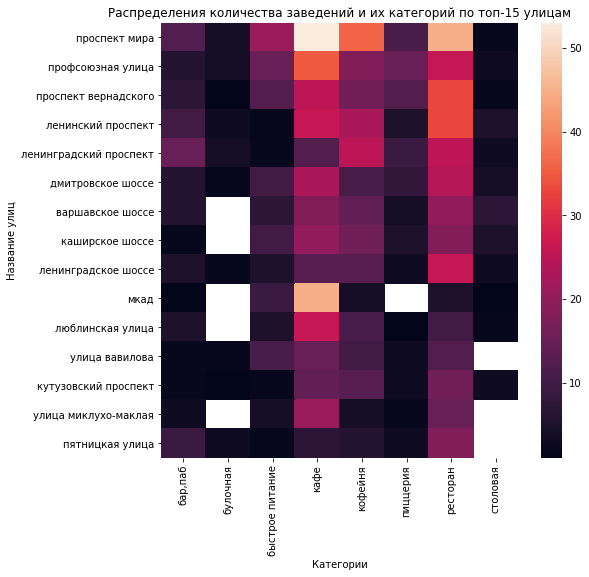

In [51]:
plt.figure(figsize=(8,8))
sns.heatmap(data_street.set_index('street'))
plt.title('Распределения количества заведений и их категорий по топ-15 улицам')
plt.xlabel('Категории')
plt.ylabel('Название улиц')
plt.show()

Наиболее популярными улицами являются проспект Мира, Профсоюзная, проспект Вернадского и Ленинский проспект. Чаще всего на них встречаются кафе, рестораны и кофейни.

### Улицы с одним объектом общепита

In [52]:
#создам таблицу с названиями улиц с одним объектом общепита и добавлю категорию этих заведений 
#с помощью присоединения столбца из другой таблицы
data_one_object = data.groupby('street').agg({'name': 'count'}).reset_index()
data_one_object = data_one_object.query('name ==1')
data_one_object = data_one_object.merge(data[['street', 'category']], on = 'street')
data_one_object

,street,name,category
0,1-й автозаводский проезд,1,кафе
1,1-й балтийский переулок,1,ресторан
2,1-й варшавский проезд,1,кафе
3,1-й вешняковский проезд,1,кафе
4,1-й голутвинский переулок,1,"бар,паб"
...,...,...,...
452,электрический переулок,1,столовая
453,юго-западный административный округ,1,кафе
454,якиманский переулок,1,кафе
455,яковоапостольский переулок,1,кофейня


In [53]:
b = data_one_object.groupby('category').agg({'street':'count'}).reset_index().sort_values(by='street', ascending=False)
b.rename(columns={'street': 'count'}, inplace=True)
b['perc'] = round(b['count']/ b['count'].sum() *100) 
b

,category,count,perc
3,кафе,159,35.0
6,ресторан,93,20.0
4,кофейня,84,18.0
0,"бар,паб",39,9.0
7,столовая,36,8.0
2,быстрое питание,23,5.0
5,пиццерия,15,3.0
1,булочная,8,2.0


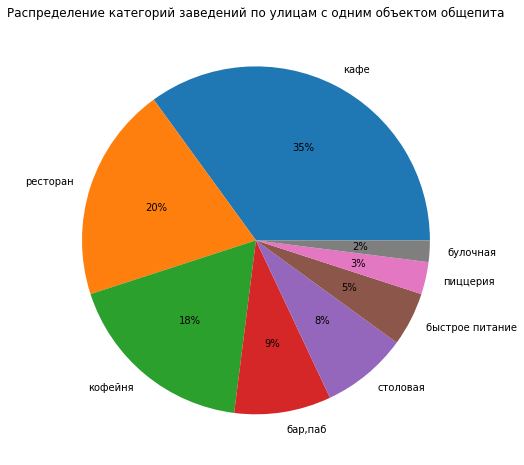

In [54]:
plt.figure(figsize=(8,8))
plt.pie(b['perc'], labels = b['category'], autopct = '%.0f%%')
plt.title('Распределение категорий заведений по улицам с одним объектом общепита')
plt.show()

Всего улиц с одним объектом общепита - 458. Чаще всего на них расположены кафе (35%), рестораны (20%) и кофейни (18%).

### Медианная стоимость заказа по районам на хороплете

In [55]:
data_bill = data.groupby('district').agg({'middle_avg_bill':'median'}).reset_index().sort_values(by='middle_avg_bill', ascending=False)
data_bill

,district,middle_avg_bill
1,Западный административный округ,1000.0
5,Центральный административный округ,1000.0
4,Северо-Западный административный округ,700.0
2,Северный административный округ,650.0
7,Юго-Западный административный округ,600.0
0,Восточный административный округ,575.0
3,Северо-Восточный административный округ,500.0
8,Южный административный округ,500.0
6,Юго-Восточный административный округ,450.0


In [56]:
moscow_lat, moscow_lng = 55.751244, 37.618423
m2=Map(location=[moscow_lat, moscow_lng])

Choropleth(
    geo_data=state_geo,
    data=data_bill,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='Blues',
    fill_opacity=0.7,
    legend_name='Медианная стоимость заказа по районам',
).add_to(m2)

# выводим карту
m2

По медианной стоимости заказа выделяются 2 района с наибольшей стоимостью - Центральный и Западный, и 3 района с наименьшей стоимостью - Юго-Восточный, Южный и Северо-Восточный.
Удаленность от центра снижает среднюю стоимость заказа в 1,5-2 раза (за исключением Западного района).

### Общий вывод по анализу данных

- по общему количеству заведений в датасете лидируют следующие категории заведений: кафе, ресторан, кофейня. Они же и составляют большую часть сетевых заведений и входят в топ-15 самых популярных по Москве. Все три категории в большем количестве расположены во всех округах Москвы. Но для центрального округа нужно еще добавить бар/паб. Также отличительной особенностью заведений этих категорий является наибольшее количестсво посадочных мест;
- наименее популярные категории булочная и столовая;
- большая часть заведений относится к несетевым (62%);
- лидеры сетевых заведений: Шоколадница с большим отрывом по количеству заведений (119). Далее идут - Домино'с Пицца (76), Додо пицца (74), One Price Coffee (71), Яндекс Лавка(69) и Cofix (65). Отличительные особенности этих сетей:
    - средняя цена чека у большинства заведений до 700руб,
    - средняя цена чашки кофе - около 100руб, кроме Шоколадницы - 256руб,
    - более 70% популярных сетей занимают кофейни (33%), кафе и рестораны (по 20%).
    
- в Центральном районе сосредоточена наибольшая часть заведений (в среднем в 3 раза больше, чем в остальных районах)
- рейтинг всех заведений по регионам варьируется от 4 до 4.4. Наилучший рейтинг наблюдается у баров/пабов, наименьший - у ресторанов быстрого питания. 
- центральный административный округ лидирует по среднему рейтингу заведений - 4.38, далее можно выделить Северный и Северо-Западный - 4.24 и 4.21 соотвественно. Округ с наименьшим рейтингом - Юго-Восточный - 4.1.
- в южной и юго-восточной части Москвы гораздо меньше расположено заведений (в 2-3 раза).
- наиболее популярными улицами являются проспект Мира, Профсоюзная, проспект Вернадского и Ленинский проспект. Чаще всего на них встречаются кафе, рестораны и кофейни.
- на улицах с одним объектом общепита расположены кафе (35%), рестораны (20%) и кофейни (18%).
- По медианной стоимости заказа выделяются 2 района с наибольшей стоимостью - Центральный и Западный, и 3 района с наименьшей стоимостью - Юго-Восточный, Южный и Северо-Восточный. Удаленность от центра снижает среднюю стоимость заказа в 1,5-2 раза (за исключением Западного района).

**Рекомендации:**
1. Если не учитывать условия конкуренции:
    - обратить внимание на наиболее популярные категории заведений - кафе, ресторан, кофейня, для центрального округа ещё паб/бар. Можно предположить, если их большинство, то они пользуются спросом.
    - рекомендуемые улицы для открытия заведения - проспект Мира, Профсоюзная, проспект Вернадского и Ленинский проспект
    - количество посадочных мест - около 80
    - если это будет заведение с чеком выше среднего, то следует рассмотреть районы Центральный и Западный.
2. Если идти от обратного, и выбирать места с наименьшей конкуренцией, при этом нужно учитывать, что, возможно, там заведения не пользуются спросом
    - можно выбрать районы с наименьшим количеством заведений, либо улицы с одним объектом общепита. Районы - юг и юго-восток Москвы, но при этом это районы с наименьшим средним чеком.
    - по рекомендуемым категориям в этих местах остаются ресторан, кафе или кофейня.
    - также в этих районах сосредоточены заведения с наименьшим средним рейтингом (4.1-4.18). 
    - в связи с чем есть предположение открыть качественное стоящее заведение при наименьшей конкуренции.

## Детализация исследования: открытие кофейни

### Анализ расположения кофеен

In [57]:
#посчитаю, сколько всего кофеен в датасете
data_cof = data.query('category == "кофейня"')
print('Общее количество кофеен:', data_cof['name'].count())

Общее количество кофеен: 1412


In [58]:
print('Доля кофеен среди всех заведений:', round(data_cof['name'].count() / data['name'].count()*100), '%') 

Доля кофеен среди всех заведений: 17 %


In [59]:
#найду количество кофеен по округам Москвы
data_cof_district = data.groupby('district').agg({'name':'count'}).reset_index().sort_values(by='name',ascending=False)
data_cof_district

,district,name
5,Центральный административный округ,2242
2,Северный административный округ,898
3,Северо-Восточный административный округ,891
8,Южный административный округ,891
1,Западный административный округ,851
0,Восточный административный округ,797
6,Юго-Восточный административный округ,714
7,Юго-Западный административный округ,709
4,Северо-Западный административный округ,409


In [60]:
moscow_lat, moscow_lng = 55.751244, 37.618423
m3 = Map(location=[moscow_lat, moscow_lng])

Choropleth(
    geo_data=state_geo,
    data=data_cof_district,
    columns=['district', 'name'],
    key_on='feature.name',
    fill_color='YlOrBr',
    fill_opacity=0.7,
    legend_name='Количество кофеен по районам',
).add_to(m3)

m3

In [61]:
m4=Map(location=[moscow_lat, moscow_lng])

# создаю пустой кластер, добавляю его на карту
marker_cluster = MarkerCluster().add_to(m4)

def create_clusters(row):
    icon_url='https://img.icons8.com/?size=512&id=26401&format=png'
    icon = CustomIcon(icon_url,icon_size=(30,30))
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
        icon=icon,
    ).add_to(marker_cluster)

data_cof.apply(create_clusters, axis=1)

m4

Большая часть кофеен сосретодочена в Центральном округе, далее идет Северный, Северо-Восточный, Южный. Наименьшее количество -  Северо-западный, Юго-Западный, Юго-Восточный и Восточный.

### Анализ особенностей кофеен

In [62]:
#поиск круглосуточных кофеен
data_cof_24 = data_cof.groupby('is_24/7').agg({'name':'count'}).reset_index().sort_values(by='name', ascending=False)
data_cof_24['perc'] = round(data_cof_24['name']/ data_cof_24['name'].sum() *100) 
data_cof_24

,is_24/7,name,perc
0,False,1353,96.0
1,True,59,4.0


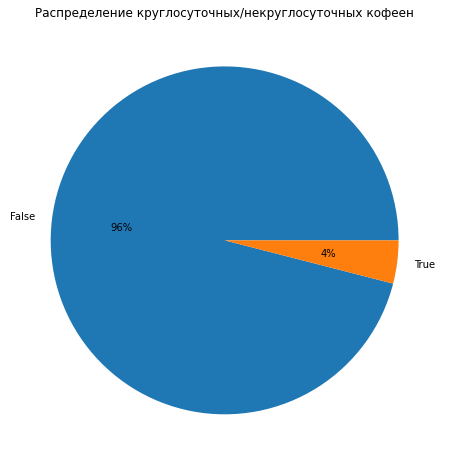

In [63]:
plt.figure(figsize=(8,8))
plt.pie(data_cof_24['perc'], labels = data_cof_24['is_24/7'], autopct = '%.0f%%')
plt.title('Распределение круглосуточных/некруглосуточных кофеен')
plt.show()

Всего 4% кофеен работает круглосуточно (59 по всей Москве).

In [64]:
data_cof_24 = data[(data['is_24/7']== True) & (data['category']== "кофейня")]
data_cof_24

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
200,wild bean,кофейня,"москва, дмитровское шоссе, 107е",Северный административный округ,"ежедневно, круглосуточно",55.878477,37.543426,3.5,NaN,NaN,NaN,NaN,1,20.0,дмитровское шоссе,True
971,wild bean cafe,кофейня,"москва, ярославское шоссе, 116",Северо-Восточный административный округ,"ежедневно, круглосуточно",55.867822,37.708853,4.0,NaN,NaN,NaN,NaN,1,25.0,ярославское шоссе,True
1047,wild bean cafe,кофейня,"москва, ярославское шоссе, вл3с3",Северо-Восточный административный округ,"ежедневно, круглосуточно",55.851778,37.676423,4.5,NaN,Цена чашки капучино:140–200 ₽,NaN,170.0,1,NaN,ярославское шоссе,True
1214,wild bean cafe,кофейня,"москва, мкад, 65-й километр, 8",Северо-Западный административный округ,"ежедневно, круглосуточно",55.813787,37.390701,4.3,NaN,NaN,NaN,NaN,1,NaN,мкад,True
1291,шоколадница,кофейня,"москва, улица народного ополчения, 49, корп. 1",Северо-Западный административный округ,"ежедневно, круглосуточно",55.794815,37.494834,4.2,средние,Средний счёт:650–850 ₽,750.0,NaN,1,200.0,улица народного ополчения,True
1468,кофе хауз,кофейня,"москва, ленинградский проспект, 74",Северный административный округ,"ежедневно, круглосуточно",55.805239,37.516246,4.0,NaN,Цена чашки капучино:235–335 ₽,NaN,285.0,1,NaN,ленинградский проспект,True
1790,кофемания,кофейня,"москва, ленинградский проспект, 37а, корп. 14,...",Северный административный округ,"ежедневно, круглосуточно",55.790899,37.542776,4.7,NaN,NaN,NaN,NaN,1,15.0,ленинградский проспект,True
1825,you&coffee,кофейня,"москва, улица золоторожский вал, 11, стр. 21",Северный административный округ,"ежедневно, круглосуточно",55.803924,37.582251,4.2,NaN,NaN,NaN,NaN,1,NaN,улица золоторожский вал,True
1883,кофемания,кофейня,"москва, лесная улица, 5",Центральный административный округ,"ежедневно, круглосуточно",55.777804,37.586346,4.4,высокие,Средний счёт:2000 ₽,2000.0,NaN,1,140.0,лесная улица,True
2030,cinnabon,кофейня,"москва, долгоруковская улица, 40",Центральный административный округ,"ежедневно, круглосуточно",55.778271,37.601991,4.2,NaN,NaN,NaN,NaN,1,230.0,долгоруковская улица,True


In [65]:
#сощдаюсводную таблицу для построения хороплета со средней стоимостью чашки кофе
data_cof_bill = data_cof.groupby('district').agg({'middle_coffee_cup':'median'}).reset_index().sort_values(by='middle_coffee_cup', ascending=False)
data_cof_bill

,district,middle_coffee_cup
7,Юго-Западный административный округ,198.0
5,Центральный административный округ,190.0
1,Западный административный округ,189.0
4,Северо-Западный административный округ,165.0
3,Северо-Восточный административный округ,162.5
2,Северный административный округ,159.0
8,Южный административный округ,150.0
6,Юго-Восточный административный округ,147.5
0,Восточный административный округ,135.0


In [66]:
m5=Map(location=[moscow_lat, moscow_lng])

Choropleth(
    geo_data=state_geo,
    data=data_cof_bill,
    columns=['district', 'middle_coffee_cup'],
    key_on='feature.name',
    fill_color='YlOrBr',
    fill_opacity=0.7,
    legend_name='Медианная стоимость чашки кофе по районам',
).add_to(m5)

# выводим карту
m5

Наибольшая средняя стоимость чашки кофе в Юго-Западном, Центральном и Западном округах. Наименьшая - в Восточном.

In [67]:
#создаю сводную таблицу для построения хороплета среднего рейтинга кофеен по районам
data_cof_rat = data_cof.groupby('district').agg({'rating': 'mean'}).reset_index().sort_values(by='rating',ascending=False)
data_cof_rat['rating']= round(data_cof_rat['rating'], 2)
data_cof_rat

,district,rating
5,Центральный административный округ,4.34
4,Северо-Западный административный округ,4.33
2,Северный административный округ,4.29
0,Восточный административный округ,4.28
7,Юго-Западный административный округ,4.28
8,Южный административный округ,4.23
6,Юго-Восточный административный округ,4.23
3,Северо-Восточный административный округ,4.22
1,Западный административный округ,4.20


In [68]:
m6=Map(location=[moscow_lat, moscow_lng])

Choropleth(
    geo_data=state_geo,
    data=data_cof_rat,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='Blues',
    fill_opacity=0.8,
    legend_name='Средний рейтинг кофеен по районам',
).add_to(m6)

m6

Кофейни с средним наивысшим рейтингом расположены в Центральном и Северо-Западном регионах.

In [69]:
#соотношение сетевых/несетвых кофеен
data_cof_chain = data_cof.groupby('chain').agg({'name':'count'}).reset_index().sort_values(by='name', ascending=False)
data_cof_chain.loc[[0], 'chain'] = 'несетевой'
data_cof_chain.loc[[1], 'chain'] = 'сетевой'
data_cof_chain['perc'] = round(data_cof_chain['name']/ data_cof_chain['name'].sum() *100) 
data_cof_chain

,chain,name,perc
1,сетевой,719,51.0
0,несетевой,693,49.0


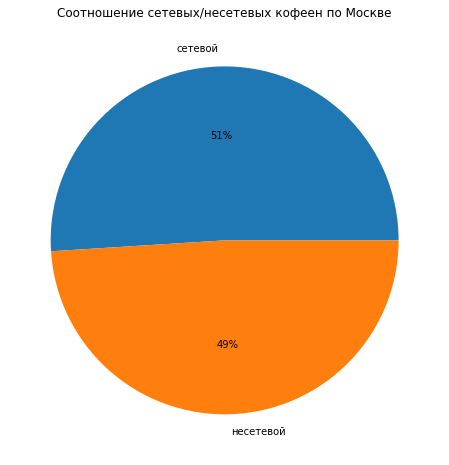

In [70]:
plt.figure(figsize=(8,8))
plt.pie(data_cof_chain['perc'], labels = data_cof_chain['chain'], autopct = '%.0f%%')
plt.title('Соотношение сетевых/несетевых кофеен по Москве')
plt.show()

Соотношение сетевых/несетевых кофеен почти одинаковое.

### **Выводы и рекомендации по открытию кофейни в Москве:**


(если не учитывать условия конкуренции, как сказано в задании, то будем выбирать наиболее популярные районы)
- количество кофеен из всех объектов общепита составляет 17%, из чего можно сделать вывод, что открытие кофейни реально.
- наиболее популярные районы для открытия кофейни являются Центральный, Северный, Северо-Восточный и Южный округа.
- при открытии кофейни в Центральном округе стоит ориентироваться на стоимость чашки капучино 190руб, в остальных 150-160руб
- средний рейтинг кофеен в выбранных районах от 4.22 (Северо-Восточный) до 4.34 (Центральный).
- круглосуточные кофейни составляют 4% от общего количества.

Ссылка на презентацию: https://drive.google.com/file/d/18PzBwfMk4weCkHtmAUZQMsxcaS3VDZRT/view?usp=share_link
    